<center><a href="https://colab.research.google.com/github/sid4sal/transfer-learning-on-object-detection-models/blob/main/Transfer_Learning_on_ssd_mobilenet_v2_ppe_dataset.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a></center>

<center><a href="https://github.com/sid4sal/transfer-learning-on-object-detection-models">
  <img src="https://img.shields.io/badge/Transfer_Learning_on_Object_Detection_Models-Github-dark_green.svg" alt="Open Github"/>
</a></center>

# **Transfer Learning on Object Detection Models**

Creating an object detector with Transfer Learning on a pre-trained model Using TensorFlow's Object Detection API

## **1. Setting up the Environment**

### 1. Importing Packages

In [ ]:
import tensorflow as tf
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os
import sys
import warnings

### 2. Installing required packages

In [ ]:
!apt-get install protobuf-compiler python-lxml python-pil
!pip install Cython pandas tf-slim lvis

Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
The following additional packages will be installed:
  python-bs4 python-chardet python-html5lib python-olefile
  python-pkg-resources python-six python-webencodings
Suggested packages:
  python-genshi python-lxml-dbg python-lxml-doc python-pil-doc python-pil-dbg
  python-setuptools
The following NEW packages will be installed:
  python-bs4 python-chardet python-html5lib python-lxml python-olefile
  python-pil python-pkg-resources python-six python-webencodings
0 upgraded, 9 newly installed, 0 to remove and 39 not upgraded.
Need to get 1,614 kB of archives.
After this operation, 8,908 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 python-bs4 all 4.6.0-1 [67.9 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/main amd64 python-pkg-resources all 39.0.1-2 [128 kB]
Get:3 http:/

### 3. Installing the Object Detection API

* Clone the TensorFlow Model Repo on github

In [ ]:
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 58313, done.
remote: Counting objects: 100% (68/68), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 58313 (delta 43), reused 65 (delta 40), pack-reused 58245
Receiving objects: 100% (58313/58313), 573.12 MiB | 36.61 MiB/s, done.
Resolving deltas: 100% (40529/40529), done.


* Install the Object Detection API

In [ ]:
%cd '/content/models/research/'
!protoc object_detection/protos/*.proto --python_out=.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

/content/models/research
Processing /content/models/research
     |████████████████████████████████| 9.6MB 37.8MB/s 
     |████████████████████████████████| 1.6MB 49.0MB/s 
     |████████████████████████████████| 61kB 356kB/s 
     |████████████████████████████████| 153kB 55.1MB/s 
     |████████████████████████████████| 829kB 40.6MB/s 
     |████████████████████████████████| 2.3MB 49.6MB/s 
     |████████████████████████████████| 686kB 44.2MB/s 
     |████████████████████████████████| 61kB 8.6MB/s 
     |████████████████████████████████| 38.2MB 78kB/s 
     |████████████████████████████████| 102kB 14.1MB/s 
     |████████████████████████████████| 51kB 6.6MB/s 
     |████████████████████████████████| 215kB 57.0MB/s 
     |████████████████████████████████| 645kB 50.7MB/s 
     |████████████████████████████████| 1.2MB 49.4MB/s 
  Created wheel for object-detection: filename=object_detection-0.1-cp37-none-any.whl size=1658069 sha256=a79d908ec6bba0ea17a1235dca4fe157a7c34f99a3099762bc1a8214

* Test the installation and import required packages from the repo

In [ ]:
%cd '/content/models/research/object_detection/builders/'
!python model_builder_tf2_test.py
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
print('Success!')

/content/models/research/object_detection/builders
2021-07-06 08:35:21.141720: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
Running tests under Python 3.7.10: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2021-07-06 08:35:23.202637: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-07-06 08:35:23.270301: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-07-06 08:35:23.270913: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-07-06 08:35:23.270955: I tensorflow/stream_exec

## **2. Define the paths and Mount GDrive (Edit)**

The project file structure is set according to following Github Project  
[![Generic badge](https://img.shields.io/badge/Transfer_Learning_on_Object_Detection_Models-Github-dark_green.svg)](https://github.com/sid4sal/transfer-learning-on-object-detection-models)  
Refer to [Medium article 1](https://medium.com/@nisargkapkar/tensorflow-2-object-detection-api-with-google-colab-b2af171e81cc?source=friends_link&sk=0bb205df0e1c29a2e78c28671ddf4494) and [Medium article 2](https://medium.com/swlh/creating-your-own-custom-object-detector-using-transfer-learning-f26918697889)

* File Structure :-
```
Google Drive
  └───[Your Project folder]
      └───project-files
          ├───annotations
          ├───datasets
          ├───exported-models
          ├───models
          ├───pre-trained-models
          └───scripts
```


**[Your Project folder]** : Name of your project folder (I have named it project-od)  
**annotations** : Contains all the TFRecords and label maps.  
**datasets** : Contains datasets for training and testing the model.  
**exported-models** : Will contain the model that you will train.  
**models** : Will Contain all the model checkpoints after training.  
**pre-trained-models** : Contains all the pretrained models.  
**scripts** : Contains all the python code required for this project.

### 1. Define the paths

Edit these Parameters according to your Model and Dataset

In [ ]:
update_project_folder = True
project_folder = 'project-od'
project_dir = '/content/drive/MyDrive/project-od'

dataset = 'covid-19_ppe_dataset'
label_map = 'label_map_covid-19_ppe_dataset.pbtxt'
tfrecord_train = 'train_covid-19_ppe_dataset.record'
tfrecord_test = 'test_covid-19_ppe_dataset.record'

model = 'ssd_mobilenet_v2_fpnlite_640x640'
pre_model = 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8'
ckpt = '/pre-trained-models/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/checkpoint/ckpt-0'
exp_model = 'my_model'

### 2. Mount your Google Drive

Mount the Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


## **3. Import the Project Files**

Import the pre-trained model and dataset. I have uploaded the files on Github [sid4sal/transfer-learning-on-object-detection-models](https://github.com/sid4sal/transfer-learning-on-object-detection-models)  
Reference :  
[Medium article 1](https://medium.com/@nisargkapkar/tensorflow-2-object-detection-api-with-google-colab-b2af171e81cc?source=friends_link&sk=0bb205df0e1c29a2e78c28671ddf4494)  
[Medium article 2](https://medium.com/swlh/creating-your-own-custom-object-detector-using-transfer-learning-f26918697889)

### 1. Set up the Google Drive

* Update the path of folder for storing project files

In [ ]:
def get_folder_name(name):
    """
    Get the name of the directory to store your project files.
    If the folder already exists, append a number to it's name.
    """
    path = os.path.join('/content/drive/MyDrive',name)
    if not os.path.isdir(path):
        return name

    i = 0
    while True:
        i = i + 1
        p = path + '-{}'.format(i)
        n = name + '-{}'.format(i)
        if not os.path.isdir(p):
            return n

In [ ]:
if update_project_folder:
  project_folder = get_folder_name(project_folder)
  print("Your Project Folder name is '{}'".format(project_folder))
  project_dir = os.path.join('/content/drive/MyDrive', project_folder)
  print("Your working directory for this project is '{}'".format(project_dir))

Your Project Folder name is 'project-od'
Your working directory for this project is '/content/drive/MyDrive/project-od'


* Create the project folder in GDrive

In [ ]:
if update_project_folder:
  os.mkdir(project_dir)
  print("Folder created!")

Folder created!


### 2. Import the files in Google Drive

* CD into your Working Directory (Project Directory)  
The directory that we printed above

In [ ]:
%cd {project_dir}

/content/drive/MyDrive/project-od


* Clone the Github Repo  
I have created a github repo (contains pre-trained models, dataset and scripts)  
you can make your own if you want, Guide (Medium article) for this is mentioned above.

In [ ]:
!git clone https://github.com/sid4sal/transfer-learning-on-object-detection-models.git .

Cloning into '.'...
remote: Enumerating objects: 1558, done.
remote: Counting objects: 100% (1558/1558), done.
remote: Compressing objects: 100% (797/797), done.
remote: Total 1558 (delta 435), reused 1542 (delta 423), pack-reused 0
Receiving objects: 100% (1558/1558), 111.29 MiB | 21.33 MiB/s, done.
Resolving deltas: 100% (435/435), done.
Checking out files: 100% (1532/1532), done.


## **4. Generate the paths**

* Update the project_dir and cd into it

In [ ]:
project_dir = project_dir + '/project-files'
print(project_dir)

/content/drive/MyDrive/project-od/project-files


In [ ]:
%cd {project_dir}

/content/drive/MyDrive/project-od/project-files


* Generate/Update the paths

In [ ]:
scripts_p = project_dir + '/scripts'
dataset_p = project_dir + '/datasets/' + dataset + '/images'
dataset_train_p = dataset_p + '/train'
dataset_test_p = dataset_p + '/test'
label_map_p = project_dir+ '/annotations/' + label_map
tfrecord_train_p = project_dir + '/annotations/' + tfrecord_train
tfrecord_test_p = project_dir + '/annotations/' + tfrecord_test
model_p = project_dir + '/models/' + model
pipeline_p = model_p + '/pipeline.config'
ckpt_p = project_dir + ckpt
pre_graph_p = project_dir + '/pre-trained-models/' + pre_model + '/saved_model'
exp_model_p = project_dir + '/exported-models/' + exp_model

## **5. Split the dataset (optional)**

Split the dataset into test and train sets, if you haven't already done it.  
(Check out the `partition_dataset.py` file in the `scripts` folder for more information)

**Note:- Wait at least 5 mins before running the following script**  
It takes 5 mins to reflect the changes in google drive after cloning a github repo in it. (may take longer for large repo)

In [ ]:
%cd {scripts_p}
!python partition_dataset.py -x -i {dataset_p} -r 0.1

/content/drive/MyDrive/project-od/project files/scripts


## **6. Generate the Tfrecords**

**Note:- Wait at least 3 mins before running the following script**  
It takes 3 mins to reflect the changes in google drive after spliting the dataset. (may take longer for large dataset)

In [ ]:
%cd {scripts_p}
!python generate_tfrecord.py -x {dataset_train_p} -l {label_map_p} -o {tfrecord_train_p}
!python generate_tfrecord.py -x {dataset_test_p} -l {label_map_p} -o {tfrecord_test_p}

/content/drive/MyDrive/project-od/project-files/scripts
Successfully created the TFRecord file: /content/drive/MyDrive/project-od/project-files/annotations/train_covid-19_ppe_dataset.record
Successfully created the TFRecord file: /content/drive/MyDrive/project-od/project-files/annotations/test_covid-19_ppe_dataset.record


## **7. Configure the pipeline.config file (Edit)**

### 1. Get the layer names

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir={pre_graph_p+'/tblog'}

In [ ]:
%cd {scripts_p}
!python import_pb_to_tensorboard.py --model_dir {pre_graph_p} --log_dir {pre_graph_p+'/tblog'}

### 2. Edit the pipline.config file

 Edit the pipeline.config file (in the models directory) according to your need.  
 Important paramaters in the pipeline.config are :-
 * **num_classes:** 3 (#number of classes your model can classify/ number of different labels)

* **batch_size:** 16

* **fine_tune_checkpoint:** "pre-trained-models/ssdlite_mobilenet_v2/checkpoint/ckpt-0" (#path to checkpoint of pre-trained-model)

* **num_steps:** 250000 (#maximum number of steps to train model, note that this specifies the maximum number of steps, you can stop model training on any step you wish)

* **fine_tune_checkpoint_type:** "detection" (#since we are training full detection model)

* **use_bfloat16:** false (#Set this to true only if you are training on a TPU)

* **label_map_path:** "annotations/label_map.pbtxt" (#path to your label_map file)

* **input_path:** "annotations/train.record" (#path to train.record)

* **label_map_path:** "annotations/label_map.pbtxt" (#path to your label_map file)

* **input_path:** "annotations/test.record" (#Path to test.record)

In [ ]:
num_classes_set = 5
batch_size_set = 16
num_steps_set = 1000

In [ ]:
# Edit Pipeline config
from google.protobuf import text_format
from object_detection.protos import pipeline_pb2

pipeline = pipeline_pb2.TrainEvalPipelineConfig()
config_path = pipeline_p
with open(config_path, "r") as f:
    proto_str = f.read()
    text_format.Merge(proto_str, pipeline)

pipeline.model.ssd.num_classes = num_classes_set
pipeline.train_input_reader.tf_record_input_reader.input_path[:] = [tfrecord_train_p]
pipeline.train_input_reader.label_map_path = label_map_p
pipeline.eval_input_reader[0].tf_record_input_reader.input_path[:] = [tfrecord_test_p]
pipeline.eval_input_reader[0].label_map_path = label_map_p
pipeline.train_config.fine_tune_checkpoint = ckpt_p
pipeline.train_config.batch_size = batch_size_set
pipeline.train_config.num_steps = num_steps_set
pipeline.train_config.fine_tune_checkpoint_type = "detection"

# pipeline.model.ssd.feature_extractor.type = "ssd_mobilenet_v2_fpn_keras"
# pipeline.train_config.freeze_variables = ['FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_0/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_1_depthwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_1_pointwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_2_depthwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_2_pointwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_3_depthwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_3_pointwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_4_depthwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_4_pointwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_5_depthwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_5_pointwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_6_depthwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_6_pointwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_7_depthwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_7_pointwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_8_depthwise/add_fold',
#                                           'FeatureExtractor/MobilenetV1/MobilenetV1/Conv2d_8_pointwise/add_fold']


config_text = text_format.MessageToString(pipeline)
with open(config_path, "w") as f:
    f.write(config_text)

!cat {pipeline_p} # Print the edited pipeline.config file.

model {
  ssd {
    num_classes: 5
    image_resizer {
      fixed_shape_resizer {
        height: 640
        width: 640
      }
    }
    feature_extractor {
      type: "ssd_mobilenet_v2_fpn_keras"
      depth_multiplier: 1.0
      min_depth: 16
      conv_hyperparams {
        regularizer {
          l2_regularizer {
            weight: 4e-05
          }
        }
        initializer {
          random_normal_initializer {
            mean: 0.0
            stddev: 0.01
          }
        }
        activation: RELU_6
        batch_norm {
          decay: 0.997
          scale: true
          epsilon: 0.001
        }
      }
      use_depthwise: true
      override_base_feature_extractor_hyperparams: true
      fpn {
        min_level: 3
        max_level: 7
        additional_layer_depth: 128
      }
    }
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      arg

## **8. Train and Evaluate the Model**

### 1. Start the TensorBoard

* Start the TensorBoard to visualize the training metrics  
`--logdir=[Path of your model (not the pre-trained model)]`

In [ ]:
%cd {project_dir}
%load_ext tensorboard
%tensorboard --logdir={model_p}

/content/drive/MyDrive/project-od/project files


<IPython.core.display.Javascript object>

### 2. Train the model

In [ ]:
!python model_main_tf2.py --model_dir={model_p} --pipeline_config_path={pipeline_p}

2021-06-28 15:37:05.942799: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-28 15:37:07.999256: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-28 15:37:08.028221: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-28 15:37:08.028859: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-06-28 15:37:08.028907: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-28 15:37:08.032972: I tensorflow/stream_executor/platform/default

## **9. Export the model**

In [ ]:
!python exporter_main_v2.py --input_type image_tensor --pipeline_config_path {pipeline_p} --trained_checkpoint_dir {model_p} --output_directory {exp_model_p}

2021-06-28 17:34:30.357487: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-28 17:34:33.127291: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-28 17:34:33.164649: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-28 17:34:33.165237: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-06-28 17:34:33.165279: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-28 17:34:33.183393: I tensorflow/stream_executor/platform/default

## **10. Test the model on your images**

### 1. Load your saved model

* Load the model

In [ ]:
# Load saved model and build the detection function
PATH_TO_SAVED_MODEL = exp_model_p + '/saved_model'
print('Loading model...', end='')
detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

Loading model...Done!


* Load the label_map

In [ ]:
#Loading the label_map
category_index = label_map_util.create_category_index_from_labelmap(label_map_p, use_display_name=True)

### 2. Load the images

Upload your images on drive (or colab runtime) and write the path of images in the list below.  
eg:-`img=['/content/img1.jpg', '/content/img2.jpg', '/content/img3.jpg']`

In [ ]:
#Loading the images
img = ['/content/timg.jpg'] #list containing paths of all the images

### 3. Run the model on your images

Running inference for /content/timg.jpg... Done


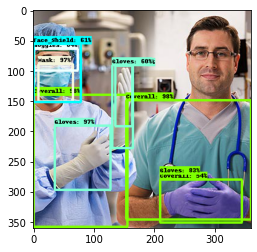

In [ ]:
warnings.filterwarnings('ignore')
def load_image_into_numpy_array(path):
    return np.array(Image.open(path))
for image_path in img:
    print('Running inference for {}... '.format(image_path), end='')
    image_np=load_image_into_numpy_array(image_path)
    input_tensor=tf.convert_to_tensor(image_np)
    input_tensor=input_tensor[tf.newaxis, ...]
    detections=detect_fn(input_tensor)
    num_detections=int(detections.pop('num_detections'))
    detections={key:value[0,:num_detections].numpy() for key,value in detections.items()}
    detections['num_detections']=num_detections
    detections['detection_classes']=detections['detection_classes'].astype(np.int64)
    image_np_with_detections=image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=100,     
          min_score_thresh=.5,      
          agnostic_mode=False)
    %matplotlib inline
    plt.figure()
    plt.imshow(image_np_with_detections)
    im = Image.fromarray(image_np_with_detections)
    im_name = os.path.split(image_path)[1]
    im.save("/content/{}{}".format("detect_", im_name))
    print('Done')
    plt.show()